In [29]:
import sys
import os
import spams
import numpy as np
import math
from sklearn import preprocessing
from multiprocessing import Pool
from functools import partial
import signal

from PIL import Image
Image.MAX_IMAGE_PIXELS = None

import warnings
warnings.simplefilter('ignore', Image.DecompressionBombWarning)


import glob
import sys


import pandas as pd


import numpy as np
import time
import cv2
import openslide
import pyvips
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

import tensorflow as tf
#tf.logging.set_verbosity(tf.logging.ERROR)
tf.get_logger().setLevel(tf.compat.v1.logging.ERROR)
import matplotlib.pyplot as plt

In [30]:
pwd

'/home/anshuman/testing_project/vahadane'

In [31]:
filename = "/home/anshuman/testing_project/vahadane/81_241.png"

level=0
I= openslide.open_slide(filename)

In [32]:
xdim,ydim=I.level_dimensions[level]

xdim,ydim

(256, 256)

In [33]:
img=np.asarray(I.read_region((0,0),level,(256,256)))[:,:,:3]
img

array([[[192, 138, 215],
        [212, 169, 225],
        [229, 198, 232],
        ...,
        [228,  90, 185],
        [228,  93, 190],
        [213,  81, 184]],

       [[209, 160, 225],
        [218, 178, 224],
        [241, 209, 241],
        ...,
        [244, 102, 196],
        [235,  94, 192],
        [217,  79, 183]],

       [[218, 163, 228],
        [227, 180, 231],
        [232, 189, 234],
        ...,
        [248, 107, 199],
        [239,  99, 194],
        [220,  82, 185]],

       ...,

       [[157,  77, 121],
        [141,  60, 107],
        [162,  84, 133],
        ...,
        [219, 131, 212],
        [227, 134, 214],
        [231, 132, 213]],

       [[177,  87, 129],
        [202, 112, 156],
        [210, 119, 169],
        ...,
        [231, 140, 214],
        [234, 141, 216],
        [237, 141, 218]],

       [[163,  64, 115],
        [205, 106, 160],
        [213, 113, 172],
        ...,
        [232, 148, 219],
        [232, 150, 223],
        [233, 149, 225]]

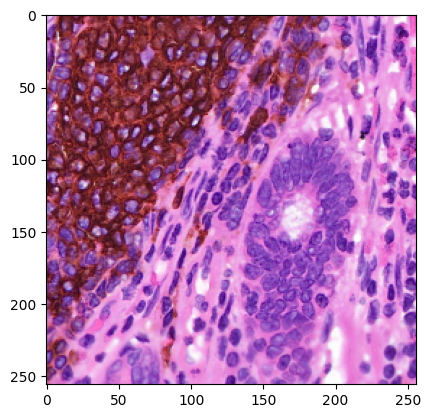

In [9]:
plt.imshow(img)
#cv2.imwrite("original_256_wsit.png",cv2.cvtColor(img,cv2.COLOR_RGB2BGR))

In [8]:
img.shape

(256, 256, 3)

In [9]:
s=img.shape
if len(s)==2:
    third_dim=1
else:
    third_dim=s[2] 

In [10]:
third_dim

3

In [11]:
import pandas as pd

pd.set_option('display.max_rows',None)
pd.set_option('display.max_colwidth',None)

In [12]:
img

array([[[192, 138, 215],
        [212, 169, 225],
        [229, 198, 232],
        ...,
        [228,  90, 185],
        [228,  93, 190],
        [213,  81, 184]],

       [[209, 160, 225],
        [218, 178, 224],
        [241, 209, 241],
        ...,
        [244, 102, 196],
        [235,  94, 192],
        [217,  79, 183]],

       [[218, 163, 228],
        [227, 180, 231],
        [232, 189, 234],
        ...,
        [248, 107, 199],
        [239,  99, 194],
        [220,  82, 185]],

       ...,

       [[157,  77, 121],
        [141,  60, 107],
        [162,  84, 133],
        ...,
        [219, 131, 212],
        [227, 134, 214],
        [231, 132, 213]],

       [[177,  87, 129],
        [202, 112, 156],
        [210, 119, 169],
        ...,
        [231, 140, 214],
        [234, 141, 216],
        [237, 141, 218]],

       [[163,  64, 115],
        [205, 106, 160],
        [213, 113, 172],
        ...,
        [232, 148, 219],
        [232, 150, 223],
        [233, 149, 225]]

In [ ]:
img[:,:,0]

In [ ]:
img[:,:,1]

In [ ]:
img[:,:,2]

In [13]:
ivec = img.reshape(-1,3)
print(ivec.shape)
#ivec[65531:65536]

(65536, 3)


In [14]:
ivec

array([[192, 138, 215],
       [212, 169, 225],
       [229, 198, 232],
       ...,
       [232, 148, 219],
       [232, 150, 223],
       [233, 149, 225]], dtype=uint8)

In [15]:
Ivecd = np.reshape(img, (s[0]*s[1],third_dim))
print(Ivecd.shape)

(65536, 3)


In [16]:
Ivecd

array([[192, 138, 215],
       [212, 169, 225],
       [229, 198, 232],
       ...,
       [232, 148, 219],
       [232, 150, 223],
       [233, 149, 225]], dtype=uint8)

In [17]:
i0 = np.array([255.0,255.0,255.0])


V=np.log(i0)- np.log(ivec+1.0)

In [18]:
print(V.shape)
V

(65536, 3)


array([[0.27857336, 0.60678961, 0.16598514],
       [0.17997138, 0.40546511, 0.12072855],
       [0.10318424, 0.24795872, 0.09022509],
       ...,
       [0.09022509, 0.53731724, 0.147636  ],
       [0.09022509, 0.52398371, 0.12961749],
       [0.08594243, 0.53062825, 0.12072855]])

In [19]:
w_threshold=220
c = (Ivecd[:,0]<w_threshold) * (Ivecd[:,1]<w_threshold) * (Ivecd[:,2]<w_threshold)

In [20]:
Ivecd=Ivecd[c]
print(Ivecd.shape)

(45335, 3)


In [21]:
VforW=np.log(i0)- np.log(Ivecd+1.0)

In [195]:
def definePar(nstains,lamb,batch=None):

	param={}	
	#param['mode']=2               #solves for =min_{D in C} (1/n) sum_{i=1}^n (1/2)||x_i-Dalpha_i||_2^2 + ... 
								   #lambda||alpha_i||_1 + lambda_2||alpha_i||_2^2
	param['lambda1']=lamb
	#param['lambda2']=0.05
	param['posAlpha']=True         #positive stains 
	param['posD']=True             #positive staining matrix
	param['modeD']=0               #{W in Real^{m x n}  s.t.  for all j,  ||d_j||_2^2 <= 1 }
	param['whiten']=False          #Do not whiten the data                      
	param['K']=nstains             #No. of stain = 2
	param['numThreads']=-1         #number of threads
	param['iter']=100               #20-50 is OK
	param['clean']=True
	if batch is not None:
		param['batchsize']=batch   #Give here input image no of pixels for traditional dictionary learning
	return param

In [196]:
param=definePar(3,0.001)

In [197]:
Ws = spams.trainDL(np.asfortranarray(np.transpose(VforW)),**param)
Ws

num param iterD: 1
Online Dictionary Learning with no parameter 
Positivity constraints on D activated
Positivity constraints on alpha activated
mode Alpha 2
Cleaning activated 
batch size: 6400
L: 3
lambda: 0.01
mode: 2
*****Online Dictionary Learning*****
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 5
Iteration: 6
Iteration: 7
Iteration: 8
Iteration: 9
Iteration: 10
Iteration: 11
Iteration: 12
Iteration: 13
Iteration: 14
Iteration: 15
Iteration: 16
Iteration: 17
Iteration: 18
Iteration: 19
Iteration: 20
Iteration: 21
Iteration: 22
Iteration: 23
Iteration: 24
Iteration: 25
Iteration: 26
Iteration: 27
Iteration: 28
Iteration: 29
Iteration: 30
Iteration: 31
Iteration: 32
Iteration: 33
Iteration: 34
Iteration: 35
Iteration: 36
Iteration: 37
Iteration: 38
Iteration: 39
Iteration: 40
Iteration: 41
Iteration: 42
Iteration: 43
Iteration: 44
Iteration: 45
Iteration: 46
Iteration: 47
Iteration: 48
Iteration: 49
Iteration: 50
Iteration: 51
Iteration: 52
Iteration:

Time elapsed : 0.186778


array([[0.25063209, 0.2108114 , 0.60191236],
       [0.66894117, 0.95985471, 0.76516517],
       [0.69978658, 0.18503374, 0.22852524]])

In [180]:
Ws

array([[0.2610847 , 0.22531114, 0.58963724],
       [0.68065355, 0.95560923, 0.77703551],
       [0.68450385, 0.18985756, 0.22032643]])

In [181]:
x = Ws[:,1]
y = Ws[:,2]

In [182]:
z = x + y


In [183]:
# Replace the first column with the third column
Ws[:, 0] = z

In [184]:
Ws

array([[0.81494839, 0.22531114, 0.58963724],
       [1.73264474, 0.95560923, 0.77703551],
       [0.41018399, 0.18985756, 0.22032643]])

In [191]:
Ws[:,0] = Ws[:,0]*0.7

In [192]:
Ws

array([[0.57046387, 0.22531114, 0.58963724],
       [1.21285132, 0.95560923, 0.77703551],
       [0.2871288 , 0.18985756, 0.22032643]])

In [185]:
Hiv=np.transpose(np.dot(np.linalg.pinv(Ws),np.transpose(V)))
Hiv[Hiv<0]=0
print(Hiv.shape)
Hiv

(65536, 3)


array([[0.23409847, 0.12796888, 0.10612959],
       [0.15625281, 0.09720626, 0.05904655],
       [0.09575005, 0.07165716, 0.02409288],
       ...,
       [0.18517505, 0.44644392, 0.        ],
       [0.17987344, 0.43272691, 0.        ],
       [0.18063432, 0.45133541, 0.        ]])

In [186]:
x = Hiv[:,1]
y = Hiv[:,2]

z = x + y

In [ ]:
z = Hiv[:,0]*0

In [ ]:
z

In [187]:
Hiv[:,0]= z

In [189]:
Hiv[:,0]= Hiv[:,0]*0.7

In [190]:
Hiv

array([[0.16386893, 0.12796888, 0.10612959],
       [0.10937697, 0.09720626, 0.05904655],
       [0.06702503, 0.07165716, 0.02409288],
       ...,
       [0.31251074, 0.44644392, 0.        ],
       [0.30290884, 0.43272691, 0.        ],
       [0.31593479, 0.45133541, 0.        ]])

In [160]:
print(Ws)

[[0.2610847  0.22531114 0.58963724]
 [0.68065355 0.95560923 0.77703551]
 [0.68450385 0.18985756 0.22032643]]


In [161]:
Whe = np.delete(Ws,2,axis=1)
Whe

array([[0.2610847 , 0.22531114],
       [0.68065355, 0.95560923],
       [0.68450385, 0.18985756]])

In [162]:
Whe.shape

(3, 2)

In [163]:
Hhe = np.delete(Hiv,1,axis=1)
print(Hhe.shape)
Hhe
x = Hhe
print(x.shape)
x

(65536, 2)
(65536, 2)


array([[0.04398682, 0.32251788],
       [0.04968904, 0.19529333],
       [0.06324222, 0.09438005],
       ...,
       [0.08781273, 0.        ],
       [0.05801717, 0.        ],
       [0.04064226, 0.        ]])

In [164]:
x.shape

(65536, 2)

In [165]:
y =Whe.T
y.shape

(2, 3)

In [166]:
vdummy =np.matmul(x,y)
print(vdummy.shape)
vdummy

(65536, 3)


array([[0.08415116, 0.33814085, 0.09134161],
       [0.05697481, 0.22044513, 0.07109025],
       [0.03777645, 0.13323649, 0.06120831],
       ...,
       [0.02292656, 0.05977005, 0.06010815],
       [0.0151474 , 0.03948959, 0.03971298],
       [0.01061107, 0.0276633 , 0.02781978]])

In [167]:
vdummy2 = np.exp(-vdummy)
print(vdummy2.shape)
vdummy2

(65536, 3)


array([[0.91929229, 0.71309484, 0.91270587],
       [0.94461786, 0.80216165, 0.93137783],
       [0.96292818, 0.87525808, 0.94062728],
       ...,
       [0.97733426, 0.94198112, 0.94166268],
       [0.98496675, 0.96127996, 0.96106525],
       [0.98944503, 0.97271583, 0.97256362]])

In [168]:
i0

array([255., 255., 255.])

In [169]:
vdummy3 =i0*np.reshape(vdummy2,(256,256,3))

In [170]:
type(vdummy3)

numpy.ndarray

In [171]:
vdummy3.shape

(256, 256, 3)

In [172]:
cv2.imwrite("w2h1.png", cv2.cvtColor((vdummy3).astype(np.uint8), cv2.COLOR_RGB2BGR))

True

In [ ]:
pwd

In [ ]:
im = cv2.imread("/drive3/Anshuman/testing_project/vahadane/w0h0.png")

In [ ]:
cv2.imwrite("w0h0.png",cv2.cvtColor(im,cv2.COLOR_RGB2BGR))

In [ ]:
Ws

In [ ]:
Hiv

In [ ]:
sepstains=[]
for i in range(3):
    vdAS = np.reshape(Hiv[:,i],(256*256,1))*np.reshape(Ws[:,i],(1,3))
    sepstains.append(np.uint8(i0*np.reshape(np.exp(-vdAS),(256,256,3))))

In [ ]:
import matplotlib.pyplot as plt



# Create a figure with three subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 4))  # 1 row, 3 columns of subplots

# Plot each image in a separate subplot
for i in range(2):
    axs[i].imshow(sepstains[i])
    axs[i].set_title(f"wsitImage {i+1}")

#axs[3].imshow(imgw)
#axs[3].set_title("W for image")

# Display the figure
plt.show()

In [ ]:
cv2.imwrite("-m31stain.png",cv2.cvtColor(sepstains[0].astype(np.uint8),cv2.COLOR_RGB2BGR))
cv2.imwrite("-m32stain.png",cv2.cvtColor(sepstains[1].astype(np.uint8),cv2.COLOR_RGB2BGR))

In [193]:
sepstains=[]

stain_to_separate = 0  # index of the stain to separate

for i in range(3):
    if i == stain_to_separate:
        # For the selected stain, create a separate image
        vdAS = np.reshape(Hiv[:, i], (256*256, 1)) * np.reshape(Ws[:, i], (1, 3))
        sepstains.append(np.uint8(i0 * np.reshape(np.exp(-vdAS), (256, 256, 3))))
    else:
        # For the other two stains, keep them together
        combined_stain = np.zeros((256, 256, 3), dtype=np.uint8)
        for j in range(3):
            if j != stain_to_separate:
                vdAS = np.reshape(Hiv[:, j], (256*256, 1)) * np.reshape(Ws[:, j], (1, 3))
                combined_stain += np.uint8(i0 * np.reshape(np.exp(-vdAS), (256, 256, 3)))
        sepstains.append(combined_stain)

In [ ]:
y = sepstains[1]
y

In [ ]:
red_channel = y[:, :, 0]
green_channel = y [:,:,1]
blue_channel = y[:,:,2]


In [ ]:
red_channel

In [ ]:
green_channel

In [ ]:
blue_channel

In [ ]:
# Get unique values and their counts
unique_values, value_counts = np.unique(red_channel, return_counts=True)

# Print unique values with their counts
for value, count in zip(unique_values, value_counts):
    print(f"Value {value}: Count {count}")

In [ ]:
unique_values, value_counts = np.unique(green_channel, return_counts=True)

# Print unique values with their counts
for value, count in zip(unique_values, value_counts):
    print(f"Value {value}: Count {count}")

In [ ]:
unique_values, value_counts = np.unique(blue_channel, return_counts=True)

# Print unique values with their counts
for value, count in zip(unique_values, value_counts):
    print(f"Value {value}: Count {count}")

In [194]:
cv2.imwrite("-Astain.png",cv2.cvtColor(sepstains[0].astype(np.uint8),cv2.COLOR_RGB2BGR))
cv2.imwrite("-Bstain.png",cv2.cvtColor(sepstains[1].astype(np.uint8),cv2.COLOR_RGB2BGR))
cv2.imwrite("-Cstain.png",cv2.cvtColor(sepstains[2].astype(np.uint8),cv2.COLOR_RGB2BGR))

True

In [ ]:
pwd

import cv2
import matplotlib.pyplot as plt

# Load your images
image1 = cv2.imread("/drive3/Anshuman/testing_project/vahadane/81_241.png")
image2 = cv2.imread("/drive3/Anshuman/testing_project/vahadane/Hstain.png")
image3 = cv2.imread("/drive3/Anshuman/testing_project/vahadane/Estain.png")
image4 = cv2.imread("/drive3/Anshuman/testing_project/vahadane/Dstain.png")
image5 = cv2.imread("/drive3/Anshuman/testing_project/vahadane/HEstain.png")
image6 = cv2.imread("/drive3/Anshuman/testing_project/vahadane/HDstain.png")
image7 = cv2.imread("/drive3/Anshuman/testing_project/vahadane/DEstain.png")

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Plot the images in the subplot
images = [image1, image2, image3, image4, image5, image6, image7]
titles = ["Original Image", "H-Stain", "E-Stain", "D-Stain", "HE-Stain", "HD-Stain", "DE-Stain"]

for i, ax in enumerate(axes.flatten()):
    if i < len(images):
        ax.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        ax.set_title(titles[i])
    ax.axis("off")

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
image1 = cv2.imread("/drive3/Anshuman/testing_project/vahadane/81_241.png")
image2 = cv2.imread("/drive3/Anshuman/testing_project/vahadane/hestain.png")
image3 = cv2.imread("/drive3/Anshuman/testing_project/vahadane/destain.png")
image4 = cv2.imread("/drive3/Anshuman/testing_project/vahadane/dhstain.png")

fig, axes = plt.subplots(1, 4, figsize=(16, 8))

# Plot the images in the subplot
images = [image1, image2, image3, image4]
titles = ["Original Image", "column1removed(frombothHandWs)-Stain", "column3removed(frombothHandWs)-Stain", "column2removed(frombothHandWs)-Stain"]

for i, ax in enumerate(axes.flatten()):
    if i < len(images):
        ax.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        ax.set_title(titles[i])
    ax.axis("off")

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(32, 16))


im1 = Image.open("/drive3/Anshuman/testing_project/vahadane/original_0_wsit.png")
im2 = Image.open("/drive3/Anshuman/testing_project/vahadane/original_256_wsit.png")
im3 = Image.open("/drive3/Anshuman/testing_project/vahadane/original_512_wsit.png")


axes[0].imshow(im1)
axes[1].imshow(im2)
axes[2].imshow(im3)

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(32, 16))


im1 = Image.open("/drive3/Anshuman/testing_project/vahadane/0_wsit.png")
im2 = Image.open("/drive3/Anshuman/testing_project/vahadane/256_wsit.png")
im3 = Image.open("/drive3/Anshuman/testing_project/vahadane/512_wsit.png")


axes[0].imshow(im1)
axes[1].imshow(im2)
axes[2].imshow(im3)

In [ ]:
#testing

fig, axes = plt.subplots(3, 1, figsize=(32, 16))
im1 = Image.open("/drive3/Anshuman/testing_project/vahadane/image_0_wsit.png")
im2 = Image.open("/drive3/Anshuman/testing_project/vahadane/image_256_wsit.png")
im3 = Image.open("/drive3/Anshuman/testing_project/vahadane/image_512_wsit.png")


axes[0].imshow(im1)
axes[1].imshow(im2)
axes[2].imshow(im3)

In [ ]:
im0 = Image.open("/drive3/Anshuman/testing_project/vahadane/81_241.png")

In [ ]:
plt.imshow(im0)

In [4]:
pwd

'/home/anshuman/testing_project/vahadane'

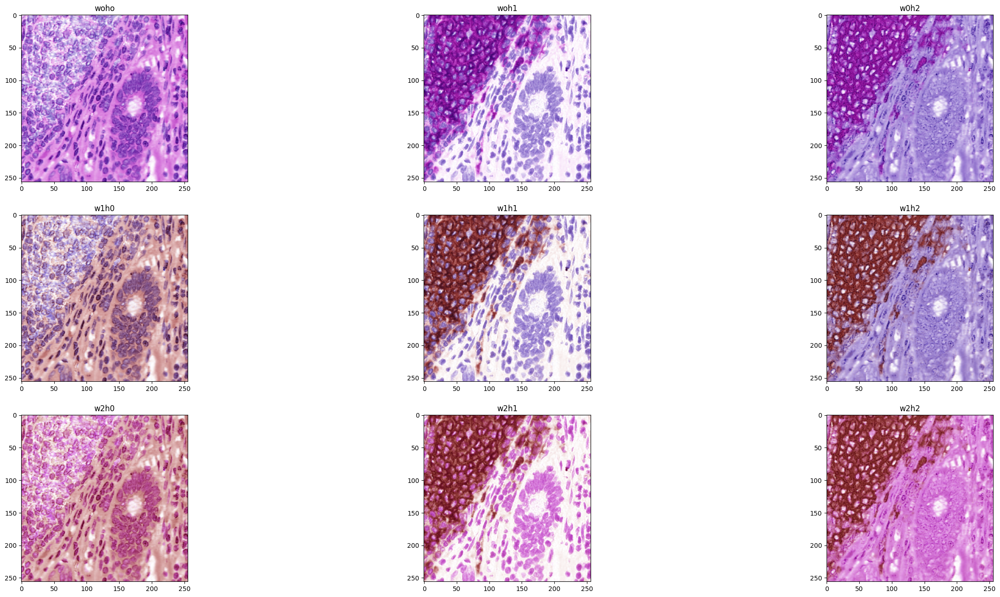

In [10]:
import matplotlib.pyplot as plt
from PIL import Image

# Load your images
im1 = Image.open("/home/anshuman/testing_project/vahadane/w0h0.png")
im2 = Image.open("/home/anshuman/testing_project/vahadane/w0h1.png")
im3 = Image.open("/home/anshuman/testing_project/vahadane/w0h2.png")
im4 = Image.open("/home/anshuman/testing_project/vahadane/w1h0.png")
im5 = Image.open("/home/anshuman/testing_project/vahadane/w1h1.png")
im6 = Image.open("/home/anshuman/testing_project/vahadane/w1h2.png")
im7 = Image.open("/home/anshuman/testing_project/vahadane/w2h0.png")
im8 = Image.open("/home/anshuman/testing_project/vahadane/w2h1.png")
im9 = Image.open("/home/anshuman/testing_project/vahadane/w2h2.png")

fig, axes = plt.subplots(3, 3, figsize=(32, 16))

# Plot the images in the subplot
images = [im1, im2, im3, im4, im5, im6, im7, im8, im9]
titles = ["woho", "woh1", "w0h2", "w1h0", "w1h1", "w1h2", "w2h0", "w2h1", "w2h2"]

for i, (im, title) in enumerate(zip(images, titles)):
    axes[i // 3, i % 3].imshow(im)
    axes[i // 3, i % 3].set_title(title)


#for ax in axes.ravel():
    #ax.axis('off')

plt.show()

In [58]:
im1 = Image.open("/home/anshuman/testing_project/vahadane/medha/Original_images_CD20/81_241.png")
im2 = Image.open("/home/anshuman/testing_project/vahadane/w0h0.png")
im3 = Image.open("/home/anshuman/testing_project/vahadane/he_81_241.png")

Text(0.5, 1.0, 'h and e mckenko_81_241')

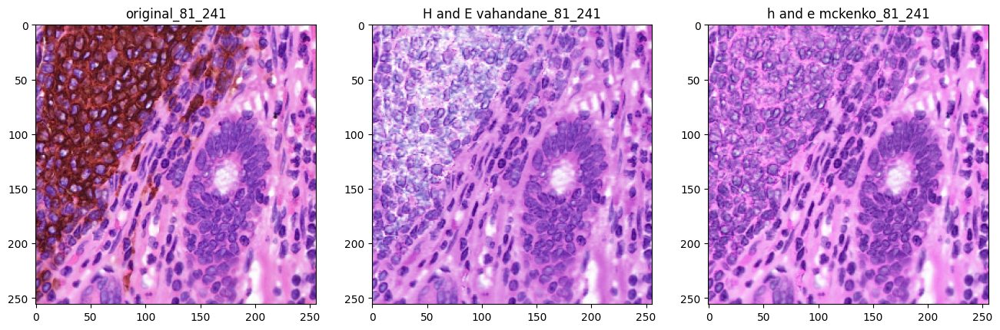

In [59]:
fig, ax = plt.subplots(1,3,figsize=(16,8))
ax[0].imshow(im1)
ax[0].set_title("original_81_241")
ax[1].imshow(im2)
ax[1].set_title("H and E vahandane_81_241")
ax[2].imshow(im3)
ax[2].set_title("h and e mckenko_81_241")

Text(0.5, 1.0, 'h and e mckenko_81_240')

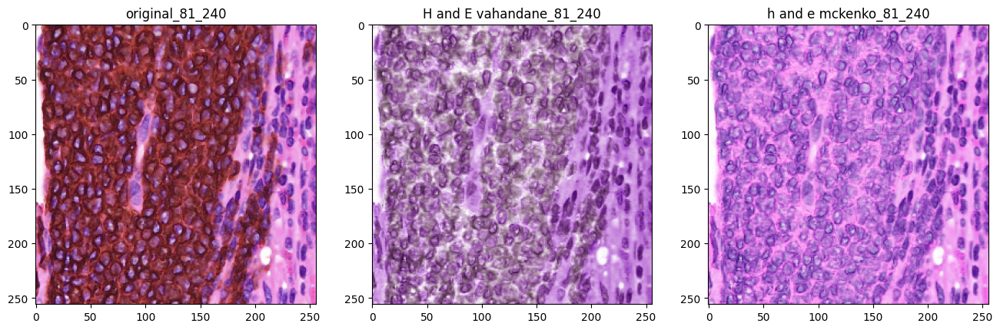

In [62]:
fig, ax = plt.subplots(1,3,figsize=(16,8))


im1 = Image.open("/home/anshuman/testing_project/vahadane/medha/Original_images_CD20/81_240.png")
im2 = Image.open("/home/anshuman/testing_project/vahadane/he81_240_vahadane.png")
im3 = Image.open("/home/anshuman/testing_project/vahadane/medha/HE_CD20/he_81_240.png")




ax[0].imshow(im1)
ax[0].set_title("original_81_240")
ax[1].imshow(im2)
ax[1].set_title("H and E vahandane_81_240")
ax[2].imshow(im3)
ax[2].set_title("h and e mckenko_81_240")

Text(0.5, 1.0, 'h and e mckenko_81_234')

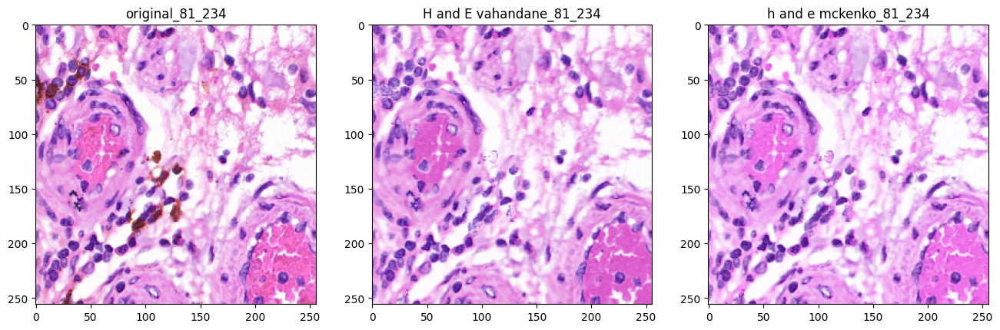

In [63]:
fig, ax = plt.subplots(1,3,figsize=(16,8))


im1 = Image.open("/home/anshuman/testing_project/vahadane/medha/Original_images_CD20/82_234.png")
im2 = Image.open("/home/anshuman/testing_project/vahadane/he82_234_vahadane.png")
im3 = Image.open("/home/anshuman/testing_project/vahadane/medha/HE_CD20/he_82_234.png")




ax[0].imshow(im1)
ax[0].set_title("original_81_234")
ax[1].imshow(im2)
ax[1].set_title("H and E vahandane_81_234")
ax[2].imshow(im3)
ax[2].set_title("h and e mckenko_81_234")

Text(0.5, 1.0, 'h and e mckenko_89_250')

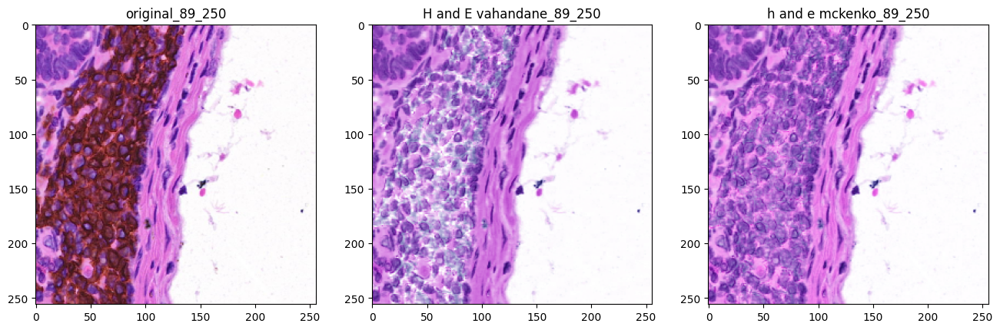

In [65]:
fig, ax = plt.subplots(1,3,figsize=(16,8))


im1 = Image.open("/home/anshuman/testing_project/vahadane/medha/Original_images_CD20/89_250.png")
im2 = Image.open("/home/anshuman/testing_project/vahadane/he89_250_vahadane.png")
im3 = Image.open("/home/anshuman/testing_project/vahadane/medha/HE_CD20/he_89_250.png")




ax[0].imshow(im1)
ax[0].set_title("original_89_250")
ax[1].imshow(im2)
ax[1].set_title("H and E vahandane_89_250")
ax[2].imshow(im3)
ax[2].set_title("h and e mckenko_89_250")

Text(0.5, 1.0, 'h and e mckenko_88_173')

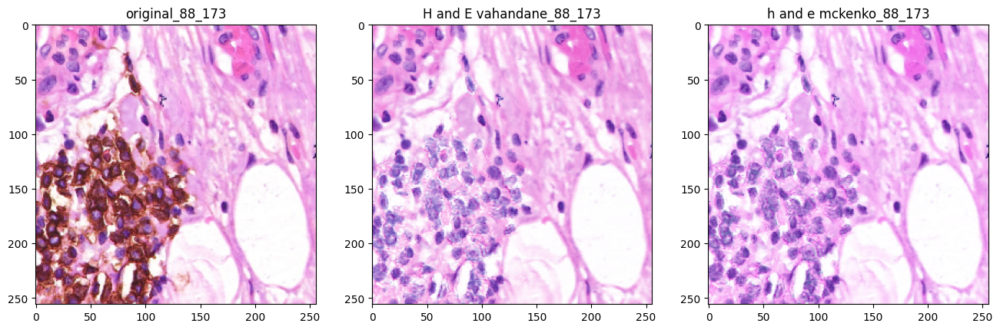

In [67]:
fig, ax = plt.subplots(1,3,figsize=(16,8))


im1 = Image.open("/home/anshuman/testing_project/vahadane/medha/Original_images_CD20/88_173.png")
im2 = Image.open("/home/anshuman/testing_project/vahadane/he88_173_vahadane.png")
im3 = Image.open("/home/anshuman/testing_project/vahadane/medha/HE_CD20/he_88_173.png")




ax[0].imshow(im1)
ax[0].set_title("original_88_173")
ax[1].imshow(im2)
ax[1].set_title("H and E vahandane_88_173")
ax[2].imshow(im3)
ax[2].set_title("h and e mckenko_88_173")

Text(0.5, 1.0, 'D')

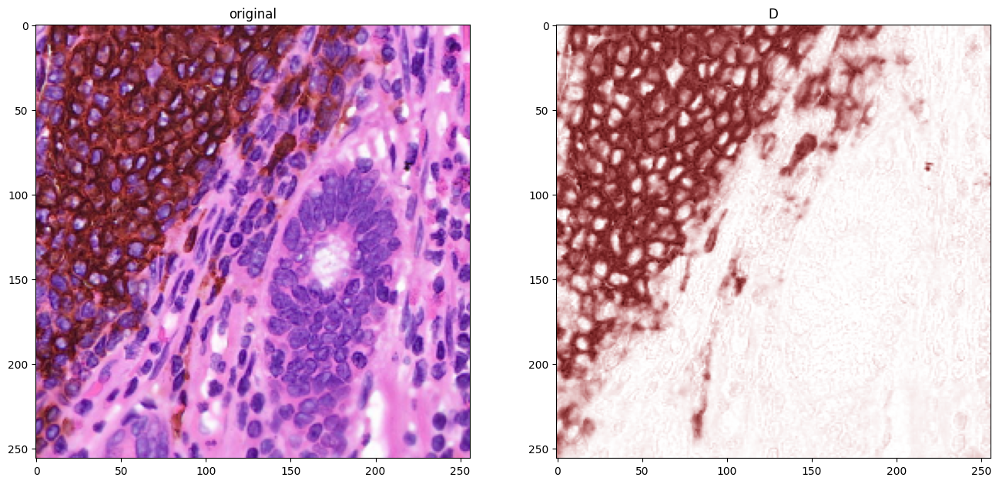

In [22]:
fig, ax = plt.subplots(1,2,figsize=(16,8))
ax[0].imshow(img)
ax[0].set_title("original")
ax[1].imshow(im1)
ax[1].set_title("D")
#ax[2].imshow(im2)
#ax[2].set_title("E")
#ax[3].imshow(im3)
#ax[3].set_title("H")

Text(0.5, 1.0, 'E')

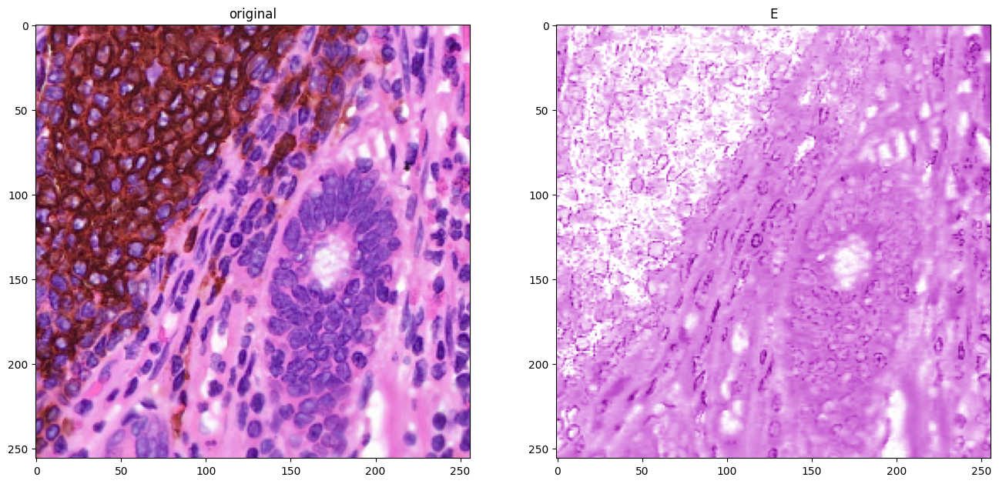

In [23]:
fig, ax = plt.subplots(1,2,figsize=(16,8))
ax[0].imshow(img)
ax[0].set_title("original")
ax[1].imshow(im2)
ax[1].set_title("E")

Text(0.5, 1.0, 'H')

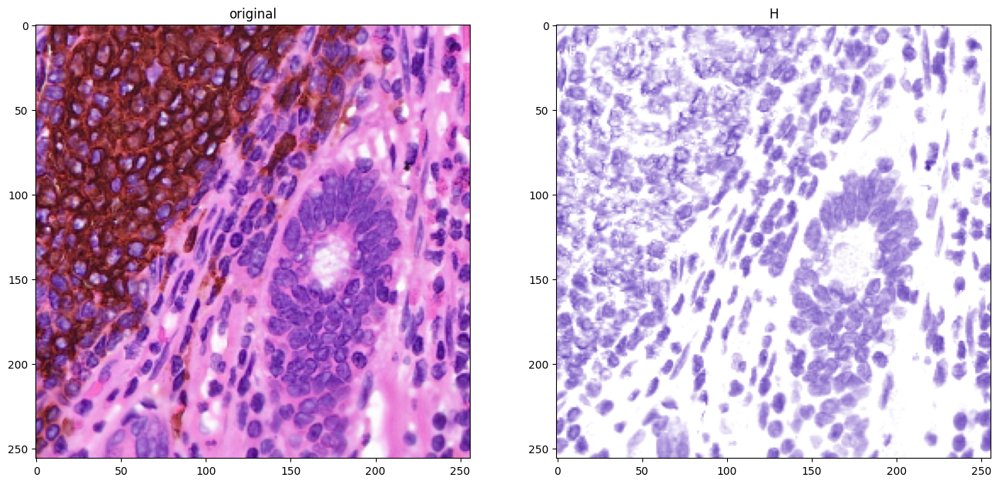

In [24]:
fig, ax = plt.subplots(1,2,figsize=(16,8))
ax[0].imshow(img)
ax[0].set_title("original")
ax[1].imshow(im3)
ax[1].set_title("H")